<a href="https://colab.research.google.com/github/MiguelUrenaPliego/labTopoSAM/blob/main/SAM_text_based_segmentation_english.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Text-based Segmentation

If running from Colab:

Go to Runtime -> Change Runtime Type: under Hardware Accelerator, select GPU and choose GPU type T4.

If running locally:

Ensure you have an Nvidia GPU with its drivers and CUDA toolkit installed.

  -drivers https://www.nvidia.es/Download/index.aspx?lang=es

  -cuda toolkit https://developer.nvidia.com/cuda-downloads

Source: segment-anything/notebooks/automatic_mask_generator_example.ipynb

In [ ]:
%pip install segment-geospatial groundingdino-py leafmap localtileserver #install libraries

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.3/82.3 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 69.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 85.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.2/40.2 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 28.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 22.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 89.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.3/250.3 kB 24.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 99.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 78.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.5/130.5 kB 18.5 MB/s eta 0:00:0

In [ ]:
import leafmap #leafmap interactive maps from google earth https://leafmap.org/#introduction
from samgeo import tms_to_geotiff
from samgeo.text_sam import LangSAM

## Load images

Two options

### Option 1: Google earth download

We will generate an interactive map.
You will see a window with the Google Earth image.
Navigate to the area you want to study and use the tools on the left to create a polygon. It is advisable to focus on a small area to speed up the processing.

In [ ]:
m = leafmap.Map(center=[43.2294769, -7.5824514], zoom=17, height="800px") # center=[lat, lon]
m.add_basemap("SATELLITE")
m.add_basemap("HYBRID")
m

Map(center=[43.2294769, -7.5824514], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title…

In [ ]:
if m.user_roi_bounds() is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = "Nothig selected"
    print("Nothig selected")
    #bbox = [-122.2659, 37.8682, -122.2521, 37.8741]
bbox

[-90.5147, 14.6431, -90.511, 14.6454]

bbox is a variable containing the coordinates of the bounds of the polygon you have selected.

### Download images inside polygon bounds

In [ ]:
image = "satellite.tif"
tms_to_geotiff(output=image, bbox=bbox, zoom=20, source="Satellite", overwrite=True)

Downloaded image 01/96
Downloaded image 02/96
Downloaded image 03/96
Downloaded image 04/96
Downloaded image 05/96
Downloaded image 06/96
Downloaded image 07/96
Downloaded image 08/96
Downloaded image 09/96
Downloaded image 10/96
Downloaded image 11/96
Downloaded image 12/96
Downloaded image 13/96
Downloaded image 14/96
Downloaded image 15/96
Downloaded image 16/96
Downloaded image 17/96
Downloaded image 18/96
Downloaded image 19/96
Downloaded image 20/96
Downloaded image 21/96
Downloaded image 22/96
Downloaded image 23/96
Downloaded image 24/96
Downloaded image 25/96
Downloaded image 26/96
Downloaded image 27/96
Downloaded image 28/96
Downloaded image 29/96
Downloaded image 30/96
Downloaded image 31/96
Downloaded image 32/96
Downloaded image 33/96
Downloaded image 34/96
Downloaded image 35/96
Downloaded image 36/96
Downloaded image 37/96
Downloaded image 38/96
Downloaded image 39/96
Downloaded image 40/96
Downloaded image 41/96
Downloaded image 42/96
Downloaded image 43/96
Downloaded 

### Option 2: Load local images
You can load your own image by specifying the file path. It should be in the .tif format with three channels: R (red), G (green), B (blue).

In [ ]:
# image = '/path/to/your/own/image.tif'

Visualize the downloaded images on the map.

In [ ]:
m.layers[-1].visible = False #If error execute again
m.add_raster(image, layer_name="Image")
m

Map(bottom=7699143.0, center=[14.640917023480272, -90.50993050491344], controls=(ZoomControl(options=['positio…

## Initialization of SAM
SAM (Segment Anything) is an image segmentation model developed by Meta, available at https://github.com/facebookresearch/segment-anything. It has a special version for satellite images at https://samgeo.gishub.org/.

For quick processing, it requires a GPU. In Google Colab, we have already configured this in the first step.

Let's download SamGeo (This may take a few minutes depending on your internet speed).

Model initialization

In [ ]:
sam = LangSAM()

final text_encoder_type: bert-base-uncased


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Downloading: "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth" to /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.39G/2.39G [00:15<00:00, 162MB/s]


Tell SAM what you want to segment

In [ ]:
text_prompt = "building roof"

## Image Segmentation

The result is saved in GEOtiff format.

  box_threshold [0,1]: Detection tolerance. High values lead to very confident detections but may overlook several elements. Low values result in less confident detections with the risk of misidentifying some elements.

  text_threshold [0,1]: The model interprets the text provided to search for the required class. You can write anything in text_prompt. Higher values of text_threshold make the model more demanding in finding classes similar to the given text. Lower values result in more general matches.

In [ ]:
sam.predict(image, text_prompt, box_threshold=0.35, text_threshold=0.3)

## Visualization of Results

You can use the following values for the cmap parameter: 'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn', and any other values accepted by Matplotlib.

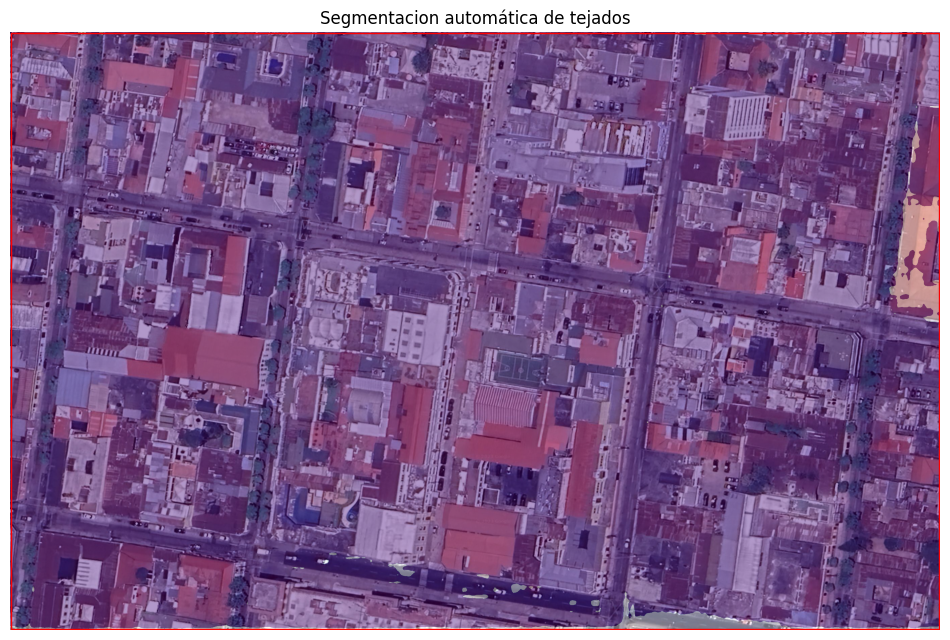

In [ ]:
sam.show_anns(
    cmap='Purples',
    box_color='red',
    title='Segmentation',
    blend=True,
)

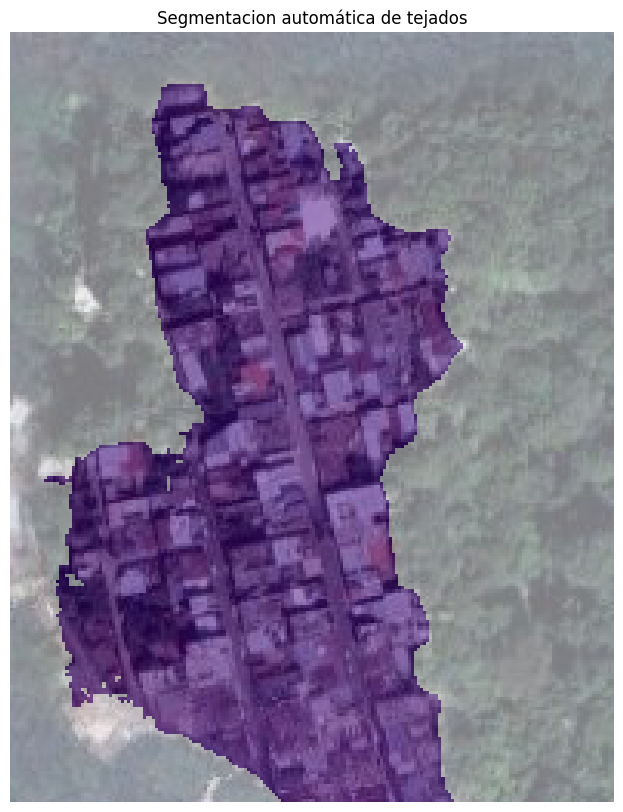

In [ ]:
sam.show_anns(
    cmap='Purples',
    add_boxes=False, # No boxes on objects
    alpha=0.5,
    title='Segmentation',
)

## Save results

Save results in .tiff format

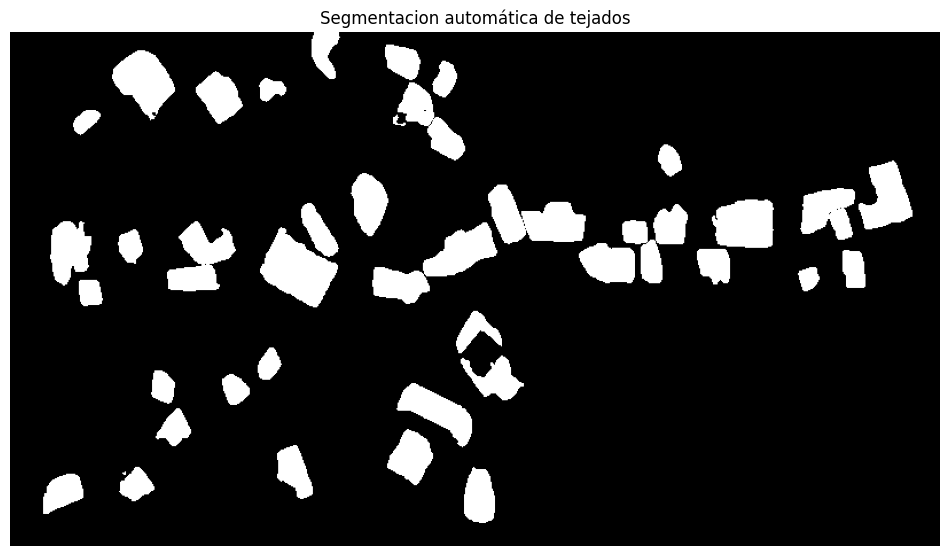

In [ ]:
sam.show_anns(
    cmap='Greys_r',
    add_boxes=False,
    alpha=1,
    title='Segmentation',
    blend=False,
    output='buildings.tif',
)

Save results in vctorial format .shp

In [ ]:
sam.raster_to_vector("buildings.tif", "buildings.shp")

## Interactive image

In [ ]:
m.add_raster("buildings.tif", layer_name="Buildings", palette="Purples", opacity=0.5, nodata=0)
style = {
    "color": "#3388ff",
    "weight": 2,
    "fillColor": "#7c4185",
    "fillOpacity": 0.5,
}
m.add_vector("buildings.shp", layer_name="Vector", style=style)
m

Map(bottom=12299713.0, center=[43.236816447920326, -7.558591246983087], controls=(ZoomControl(options=['positi…

## GUI to do the same we did with this notebook

In [ ]:
s = sam.show_map(basemap = 'SATELLITE')
s.add_basemap("HYBRID")
s

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…